*UID*: 120061660


# **CMSC426 Project 1: Color Segmentation using GMM**

# Introduction

Have you ever played with these adorable Nao robots? Click [here](http://www.youtube.com/watch?feature=player_embedded&v=Gy_wbhQxd_0) to watch a cool demo.

Nao robots are star players in RoboCup, an annual autonomous robot soccer competitions. Would you like to help us in Nao’s soccer training? We need to train Nao to detect a soccer ball and estimate the depth of the ball to know how far to kick.

Nao’s training has two phases:

- Color Segmentation using Gaussian Mixture Model (GMM)
- Ball Distance Estimation


<a name='problem'></a>
# What you need to do

To make logistics easier, we have collected camera data from Nao robot on behalf of you and saved the data in the form of color images. Click [here](https://drive.google.com/file/d/1k1dydl1Yho08isNg-_542fajXujybujH/view?usp=sharing) to download, or **run the following code block to download the training image folder to the file directory of the notebook**. The image names represent the depth of the ball from Nao robot in centimeters. -We will release the test dataset 48 hours before the deadline. **Test images are available [here](https://drive.google.com/file/d/1_qC1OnK58kYfBKZ9FUYnSmBLdfTpRmSr/view?usp=sharing) to download.**

In [ ]:
# Download training images from Google Drive
import gdown
gdown.download_folder(id="18Mx2Xc9UNFZYajYu9vfmRFlFCcna5I0J", quiet=True, use_cookies=False)

In [ ]:
# Download testing images from Google Drive
gdown.download_folder(id="1Yl4_5O_ZEkz_KJVs0_vS5TrZUqMYkwr4", quiet=True, use_cookies=False)

In [ ]:
# Check whether the training images were successfully imported
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

train_image = mpimg.imread('./train_images/106.jpg')
plt.imshow(train_image)
plt.axis("off")
plt.show()

## Problem Statement

1. Write Python code to cluster the orange ball using [Single Gaussian](https://cmsc426.github.io/colorseg/#gaussian) [30 points]

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.stats import multivariate_normal
from matplotlib.patches import Ellipse
from scipy.optimize import curve_fit

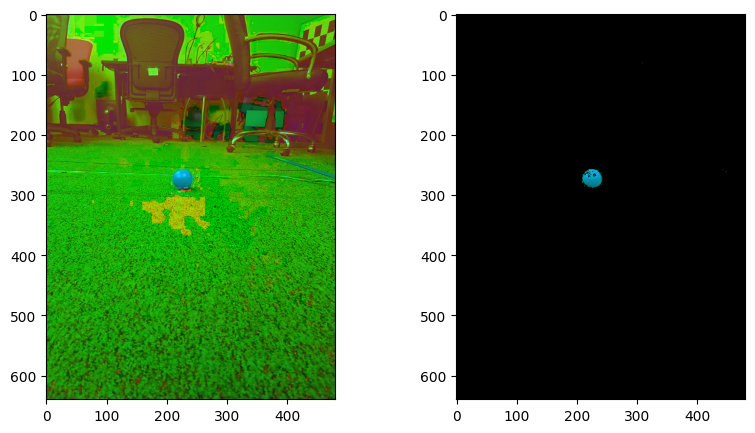

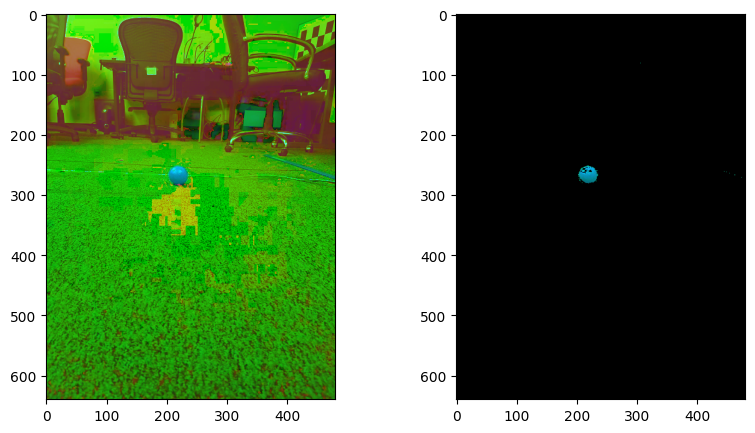

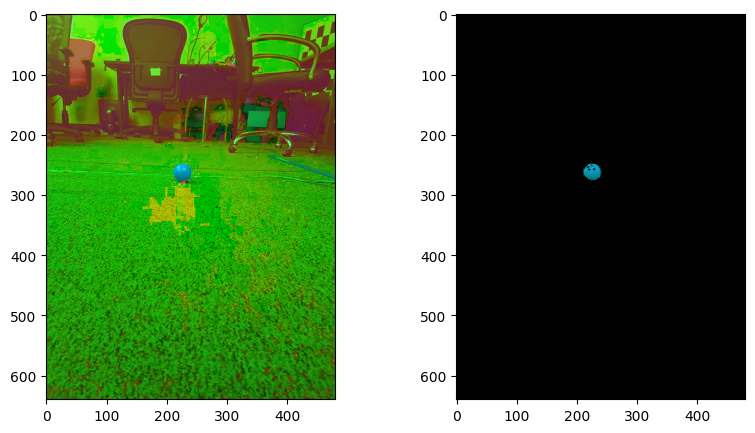

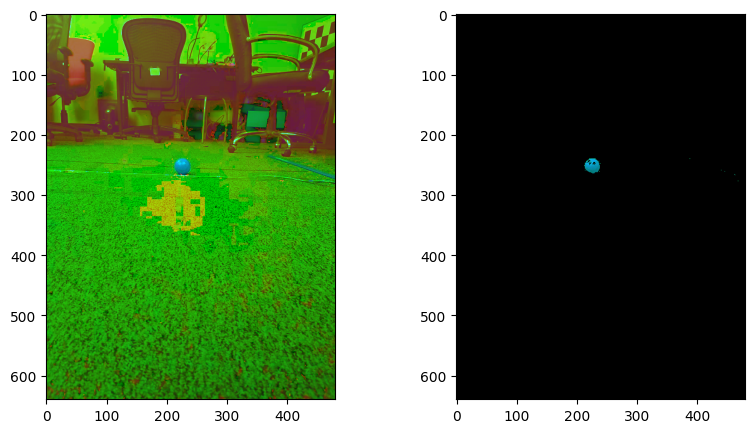

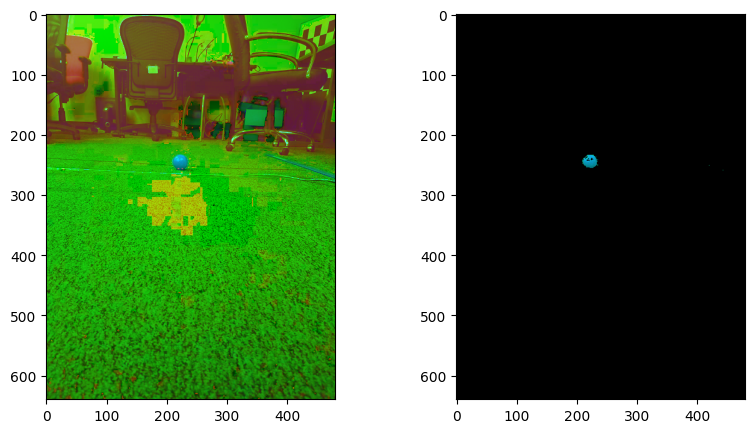

...

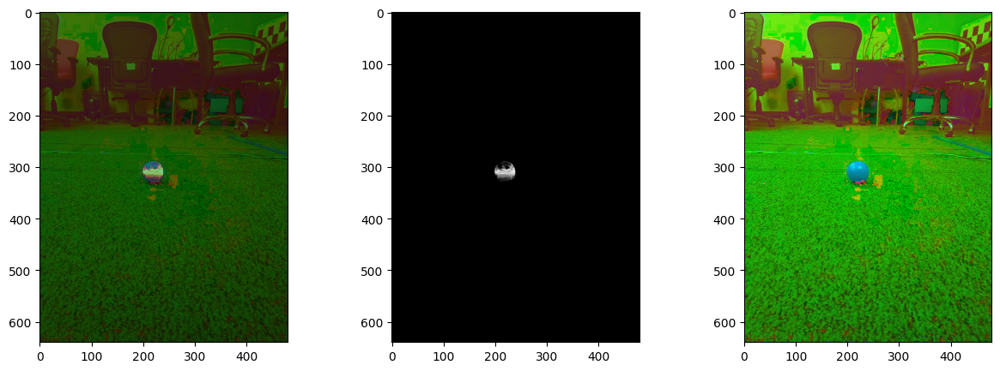

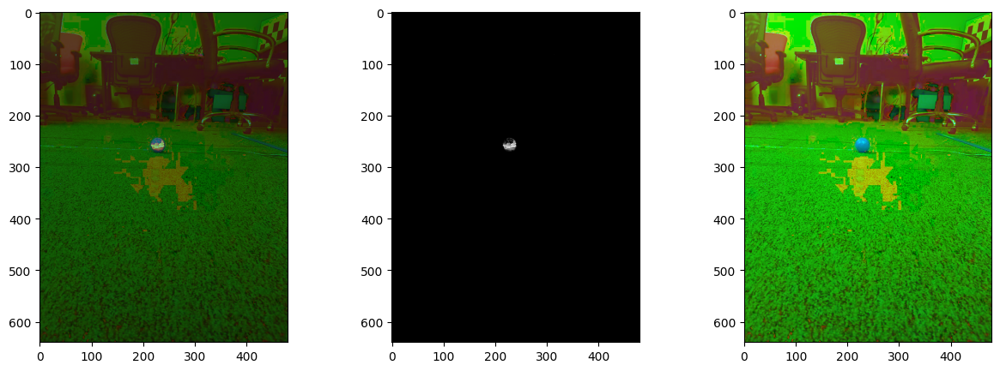

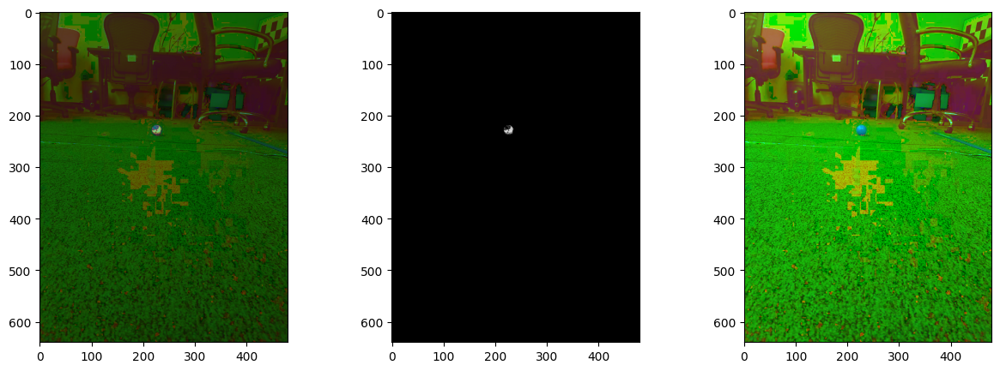

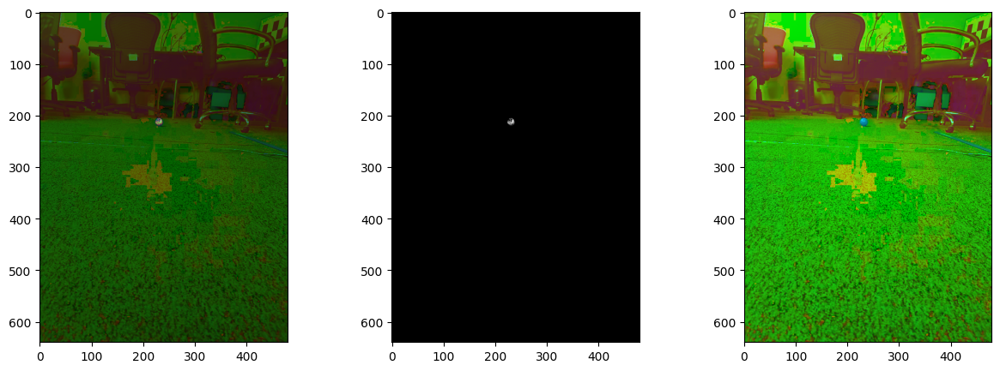

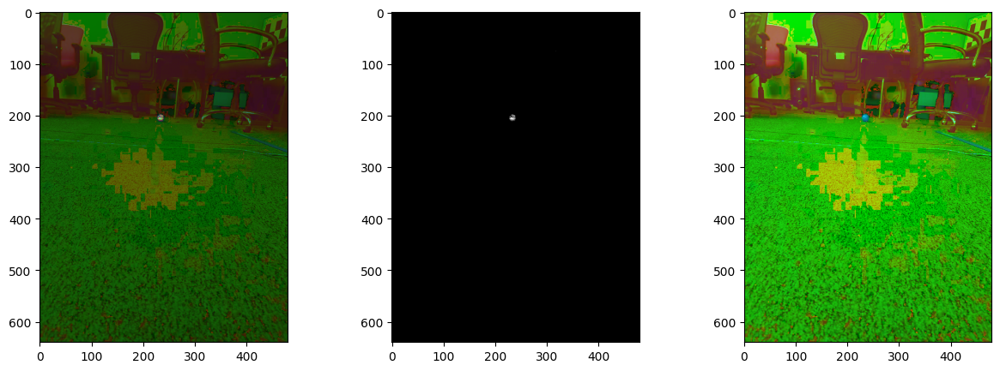

In [17]:
train = []

for image in os.listdir('./train_images'):
    img = cv2.imread('./train_images/' + image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    train.append(img)

train = np.array(train)

orange = []

for img in train:
    lower = np.array([0, 100, 120]) 
    upper = np.array([30, 240, 250]) 
    mask = cv2.inRange(img, lower, upper)
    result = cv2.bitwise_and(img, img, mask=mask)
    orange.append(result)

for i in range(len(orange)):
    plt.figure(figsize=(15,5))
    plt.subplot(131)
    plt.imshow(train[i])
    plt.subplot(132)
    plt.imshow(orange[i])
    plt.show()

orange = np.array(orange)
# print(orange.shape)
flattened = orange.reshape(-1, 3) #23 images of 480x640 pixels = 737280 pixels and then 3 channels HSV
flattened = flattened[(flattened[:, 0] != 0) & (flattened[:, 1] != 0) & (flattened[:, 2] != 0)] #remove black pixels because they are not orange
# print(flattened.shape)

mean = np.mean(flattened, axis=0)
cov = np.cov(flattened.T)

def pdf(x, mean, cov):
    x = x - mean
    det = np.linalg.det(cov)
    inv = np.linalg.inv(cov)
    norm = 1.0 / (((2 * np.pi)**(3/2)) * np.sqrt(det))
    exp = np.exp(-0.5 * np.dot(x.T, np.dot(inv, x)))
    pdf = norm * exp
    return pdf

threshold = 1e-5
prior = 0.25

def detector(image, mean, cov, threshold, prior):
    original_shape = image.shape
    image = image.reshape(-1, 3)
    pdf_values = np.apply_along_axis(pdf, 1, image, mean, cov)
    probability = (pdf_values * prior)
    #probability[probability < threshold] = 0
    return probability.reshape(original_shape[:2])

for image in os.listdir('./test_images'):
    img_arr = []
    img = cv2.imread('./test_images/' + image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    detected = detector(img, mean, cov, threshold, prior)
    plt.figure(figsize=(15,5))
    plt.subplot(131)
    plt.imshow(img)
    plt.imshow(detected, cmap='hot', alpha=0.5)
    plt.subplot(132)
    plt.imshow(detected, cmap='gray')
    plt.subplot(133)
    plt.imshow(img)
    plt.show()
    img_arr.append(detected)

2. Write Python code to cluster the orange ball using [Gaussian Mixture Model](https://cmsc426.github.io/colorseg/#gmm) [40 points] and estimate the [distance](https://cmsc426.github.io/colorseg/#distest) to the ball [20 points]. Also, plot all the GMM ellipsoids [10 points].


You are NOT allowed to use any built-in Python package(s) like *sklearn.mixture.GaussianMixture* for GMM. To help you with code implementation, we have given the pseudocode :-)

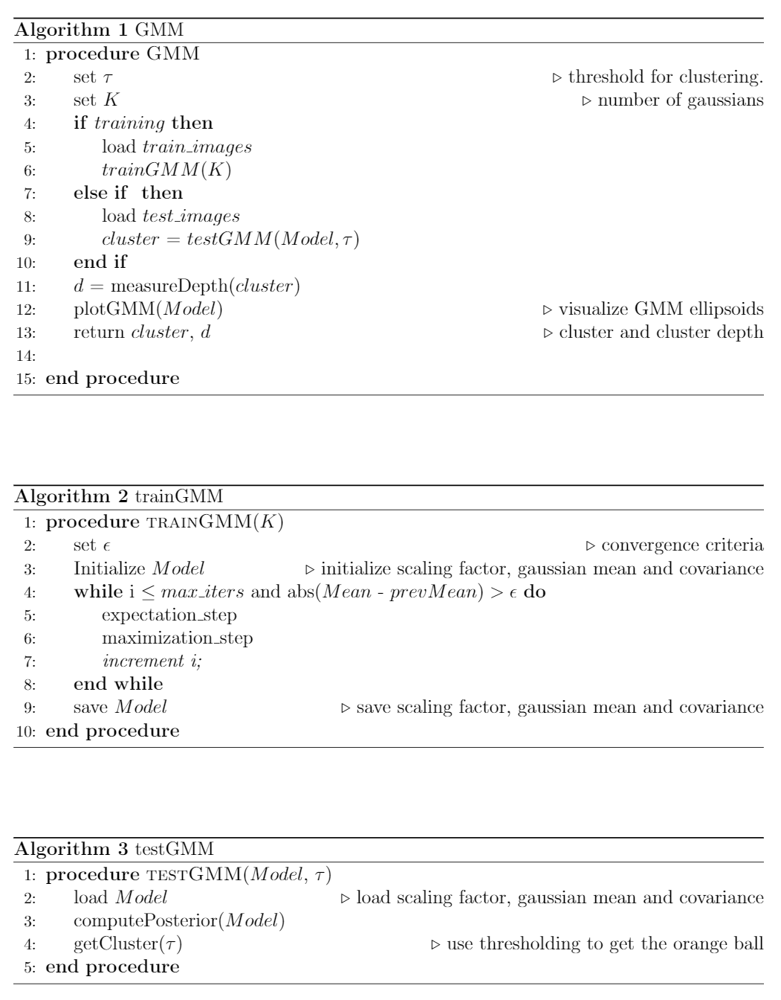

In [18]:
def gaussian_pdf(x, mean, cov): #for 2d
    d = x.shape[1]
    x_m = x - mean
    inv_cov = np.linalg.inv(cov)
    det_cov = np.linalg.det(cov)
    
    log_norm_const = -0.5 * (d * np.log(2 * np.pi) + np.log(det_cov))
    log_exp_term = -0.5 * np.sum((x_m @ inv_cov) * x_m, axis=1)
    
    return np.exp(log_norm_const + log_exp_term)

def pdf(x, mean, cov): #for 1d
    x = x - mean
    det = np.linalg.det(cov)
    inv = np.linalg.inv(cov)
    norm = 1.0 / ((2 * np.pi)**(3/2) * np.sqrt(det))
    exp = np.exp(-0.5 * np.dot(x.T, np.dot(inv, x)))
    pdf = norm * exp
    return pdf

def expectation_step(data, weights, means, covariances):
    N = data.shape[0]
    K = len(weights)
    
    resp = np.zeros((N, K))
    
    for i in range(K):
        resp[:, i] = weights[i] * gaussian_pdf(data, means[i], covariances[i])
    
    resp_sum = resp.sum(axis=1, keepdims=True)
    resp = np.divide(resp, resp_sum, where=resp_sum!=0)
    
    return resp

def maximization_step(data, responsibilities):
    N, K = responsibilities.shape
    d = data.shape[1]
    
    resp = responsibilities.sum(axis=0)
    means = (responsibilities.T @ data) / np.maximum(resp[:, np.newaxis], 1e-8)
    covariances = np.zeros((K, d, d))

    for k in range(K):
        diff = data - means[k]
        covariances[k] = (responsibilities[:, k, np.newaxis] * diff).T @ diff / np.maximum(resp[k], 1e-8) #cal covariance matrix
        covariances[k] += np.eye(d) * 1e-6  # numerical stability and to avoid those warning messages
    
    weights = resp / N
    
    return means, covariances, weights

def compute_likelihood_vectorized(pixels, means, covariances):
    K = len(means)
    likelihoods = np.zeros((pixels.shape[0], K))
    #print(likelihoods.shape)
    for i in range(K):
        #print(pixels.shape, means[i].shape, covariances[i].shape)
        likelihoods[:, i] = np.apply_along_axis(pdf, 1, pixels, mean=means[i], cov=covariances[i])
    return likelihoods


def compute_posterior_vectorized(pixels, scalars, means, covariances):
    likelihoods = compute_likelihood_vectorized(pixels, means, covariances)
    weighted_likelihoods = scalars * likelihoods
    return weighted_likelihoods / np.sum(weighted_likelihoods, axis=1, keepdims=True)

In [24]:
def trainGMM(K, data, max_iters=1000, e=1e-12):

    N, d = data.shape
    
    means = data[np.random.choice(N, K, replace=False)]
    covariances = np.array([np.cov(data.T) + np.eye(d) * 1e-3 for _ in range(K)]) #numerical stability
    weights = np.ones(K) / K
    
    prev_means = np.zeros_like(means)
    i = 0 

    while i < max_iters and np.linalg.norm(means - prev_means) > e:
        prev_means = means.copy()

        responsibilities = expectation_step(data, weights, means, covariances)
        means, covariances, weights = maximization_step(data, responsibilities)
        mean_shift = np.linalg.norm(means - prev_means)

        print(f"{i}: {mean_shift}")

        i += 1
    
    return weights, means, covariances


def testGMM(Model_parameters,threshold,prior):
  scalars, means, covariances = Model_parameters
  K = len(scalars)

  test_image_folder = './test_images'
  result_folder = './result_images'
  if not os.path.exists(result_folder):
      os.makedirs(result_folder)

  images = [f for f in os.listdir(test_image_folder) if f.endswith('.jpg')]

  cluster_parameters = []

  for image_name in images:
      img = cv2.imread(os.path.join(test_image_folder, image_name))
      img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
      height, width, _ = img_rgb.shape
      pixels = img_rgb.reshape((-1, 3))


      posteriors = compute_posterior_vectorized(pixels, scalars, means, covariances)
      segmentation_map = posteriors[:, 0].reshape((height, width))
      binary_map = (segmentation_map > threshold).astype(np.uint8) * 255

      contours, _ = cv2.findContours(binary_map, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

      if contours:
          largest_contour = max(contours, key=cv2.contourArea)
          ((x, y), radius) = cv2.minEnclosingCircle(largest_contour)
          cluster_parameters.append((x, y, radius))

      # TODO: Saving predictions to the result folder
      plt.figure(figsize=(15, 5))
      plt.subplot(131)
      plt.imshow(img_rgb)
      plt.title('Original Image')
      plt.axis('off')
      plt.subplot(132)
      plt.imshow(segmentation_map, cmap='hot')
      plt.title('Posterior Probability Map')
      plt.axis('off')
      plt.subplot(133)
      plt.imshow(binary_map, cmap='gray')
      plt.title('Segmented Image')
      plt.axis('off')
      plt.show()
      plt.savefig(os.path.join(result_folder, f'segmented_{image_name}'))
      plt.close()

  print("Segmentation complete. Results saved in the result folder.")
  return cluster_parameters

def measureDepth(cluster_parameters):
  radii = np.array([params[2] for params in cluster_parameters])
  print("Radii:", radii)

  # Sort radii in descending order (larger radius = closer object)
  sorted_indices = np.argsort(radii)[::-1]
  sorted_radii = radii[sorted_indices]

  # Create relative distances (1 for closest, increasing for farther)
  relative_distances = np.arange(1, len(radii) + 1)

  # Define the inverse model function
  def inverse_model(x, a, b):
      return a / (x + b)

  # Fit the model to our data
  popt, pcov = curve_fit(inverse_model, relative_distances, sorted_radii, p0=[np.max(radii), 1], bounds=([0, 0], [np.inf, np.inf]))

  # Extract the fitted parameters
  a, b = popt
  print("Fitted parameters: a =", a, "b =", b)

  # Function to estimate relative distance based on radius
  def estimate_relative_distance(radius):
      return (a / radius) - b

  # Estimate relative distances for all balls
  estimated_distances = [estimate_relative_distance(radius) for radius in radii]

  # Normalize estimated distances to be between 1 and len(radii)
  min_dist, max_dist = min(estimated_distances), max(estimated_distances)
  normalized_distances = 1 + (len(radii) - 1) * (np.array(estimated_distances) - min_dist) / (max_dist - min_dist)

  # Sort the normalized distances to match the original order of radii
  final_distances = normalized_distances[np.argsort(sorted_indices)]

  print("Estimated relative distances:", final_distances)
  return final_distances.tolist()

def plotGMM(model_parameters, flattened):
    scalars, means, covariances = model_parameters
    K = len(scalars)

    # Plot the GMM model
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Plot the data points
    ax.scatter(flattened[:, 0], flattened[:, 1], flattened[:, 2], c='b', marker='o', label='Data points')

    # Plot the Gaussian components
    for i in range(K):
        mean = means[i]
        covariance = covariances[i]
        x, y, z = np.random.multivariate_normal(mean, covariance, 5000).T
        ax.scatter(x, y, z, marker='.', label=f'Gaussian {i + 1}')

    ax.set_xlabel('Hue')
    ax.set_ylabel('Lightness')
    ax.set_zlabel('Saturation')
    ax.set_title('Gaussian Mixture Model')

    plt.legend()
    plt.show()

(7065600, 3)
(7575, 3)
0: 95.92044779193876
1: 21.207864049105844
2: 4.298243236329053
3: 5.5682226842192275
4: 3.595745440174919
5: 1.5878772814166406
6: 0.6717268532023688
7: 0.44262810852719514
8: 0.4936814970941533
9: 0.54841097260805
10: 0.562228732876485
11: 0.5425699931917977
12: 0.5016389400925519
13: 0.44952843523954067
14: 0.3934433117581519
15: 0.3381188295677729
16: 0.28642597328925473
17: 0.23990224799166326
18: 0.19916662485315198
19: 0.16423470067933657
20: 0.13475431576601915
21: 0.11017648287834828
22: 0.089873391509427
23: 0.07321443008546892
24: 0.05961066702870488
25: 0.04853711957462728
26: 0.039540455423295706
27: 0.03223789945958451
28: 0.026311394076054647
29: 0.02149966208601876
30: 0.017589784430486262
31: 0.014409189885216117
32: 0.011818491562599759
33: 0.00970532389282501
34: 0.007979175343008427
35: 0.006567131834187223
36: 0.005410412755986906
37: 0.0044615751936364825
38: 0.0036822697066259645
39: 0.0030414447526266324
40: 0.0025139124753930635
41: 0.002

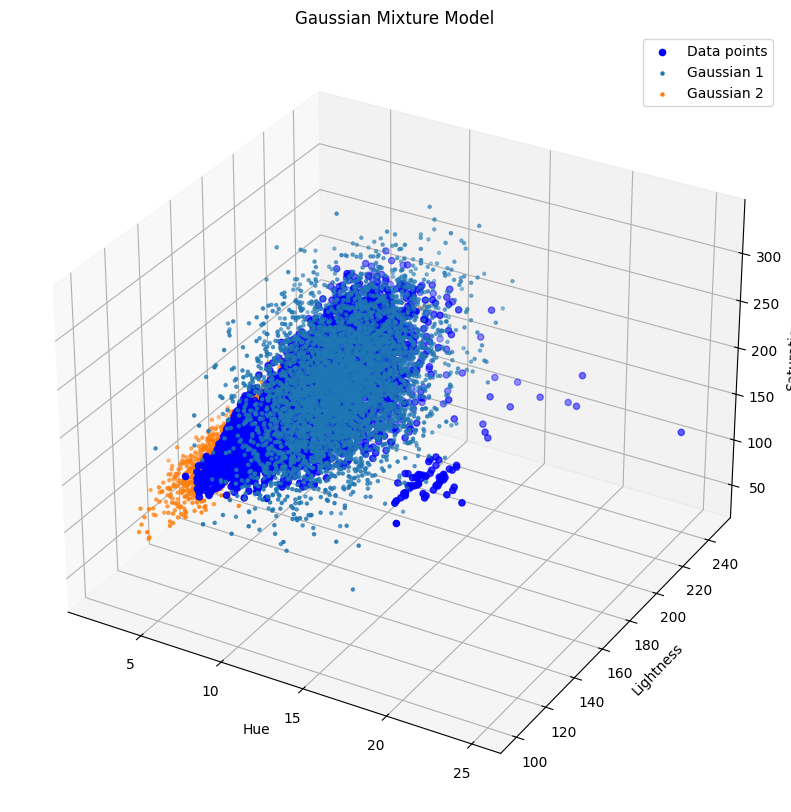

In [26]:
threshold = 1  # Threshold for clustering
K = 2  # Number of gaussians

train = []

for image in os.listdir('./train_images'):
    img = cv2.imread('./train_images/' + image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    train.append(img)

train = np.array(train)

orange = []

for img in train:
    lower = np.array([0, 100, 120]) 
    upper = np.array([30, 240, 250])
    mask = cv2.inRange(img, lower, upper)
    result = cv2.bitwise_and(img, img, mask=mask)
    orange.append(result)

orange = np.array(orange)

flattened = orange.reshape(-1, 3)
print(flattened.shape)
flattened = flattened[(flattened[:, 0] > 5) & (flattened[:, 1] > 5) & (flattened[:, 2] > 5)]
print(flattened.shape)

Model_parameters = trainGMM(K, flattened)

print("Final GMM parameters:")
print("Weights:", Model_parameters[0])
print("Means:", Model_parameters[1])
print("Covariances:", Model_parameters[2])

plotGMM(Model_parameters, flattened)

C:\Users\aryan\AppData\Local\Temp\ipykernel_17980\1263745504.py:65: RuntimeWarning:

invalid value encountered in divide



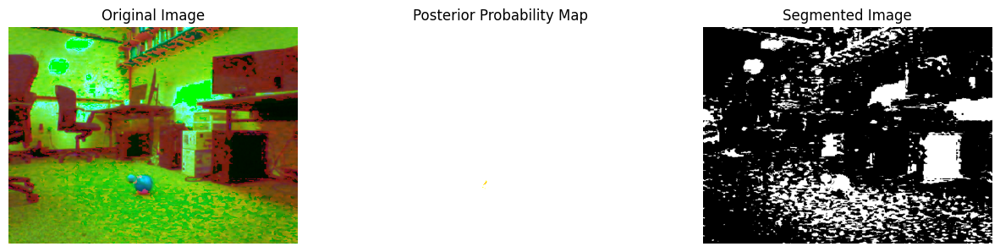

C:\Users\aryan\AppData\Local\Temp\ipykernel_17980\1263745504.py:65: RuntimeWarning:

invalid value encountered in divide



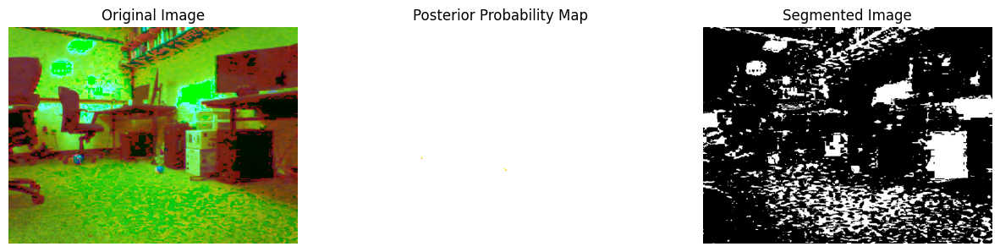

C:\Users\aryan\AppData\Local\Temp\ipykernel_17980\1263745504.py:65: RuntimeWarning:

invalid value encountered in divide



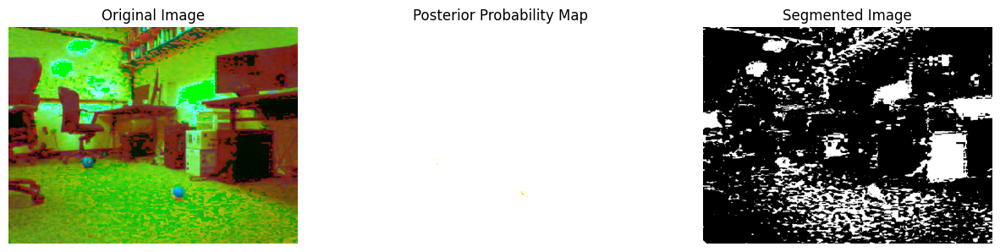

C:\Users\aryan\AppData\Local\Temp\ipykernel_17980\1263745504.py:65: RuntimeWarning:

invalid value encountered in divide



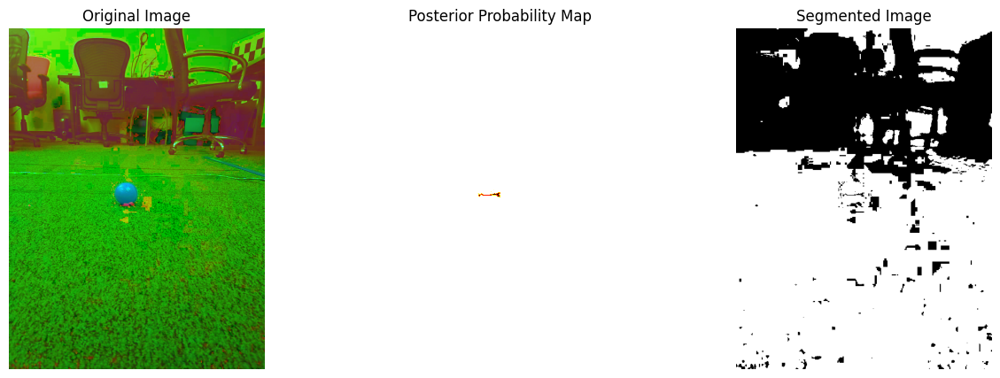

C:\Users\aryan\AppData\Local\Temp\ipykernel_17980\1263745504.py:65: RuntimeWarning:

invalid value encountered in divide



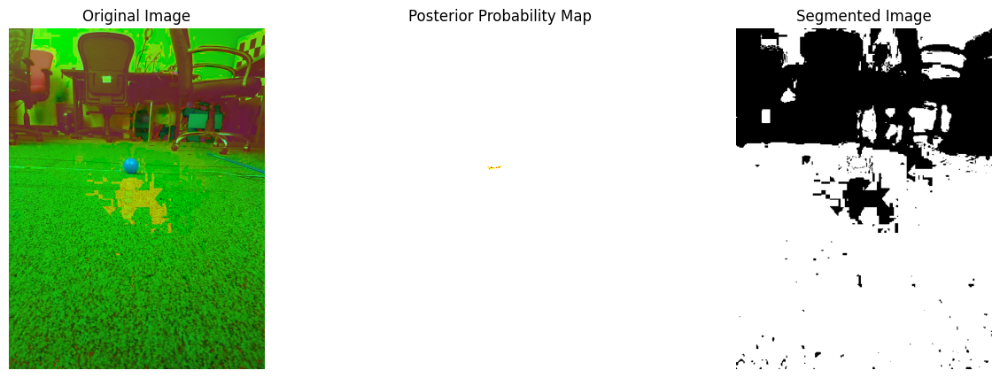

C:\Users\aryan\AppData\Local\Temp\ipykernel_17980\1263745504.py:65: RuntimeWarning:

invalid value encountered in divide



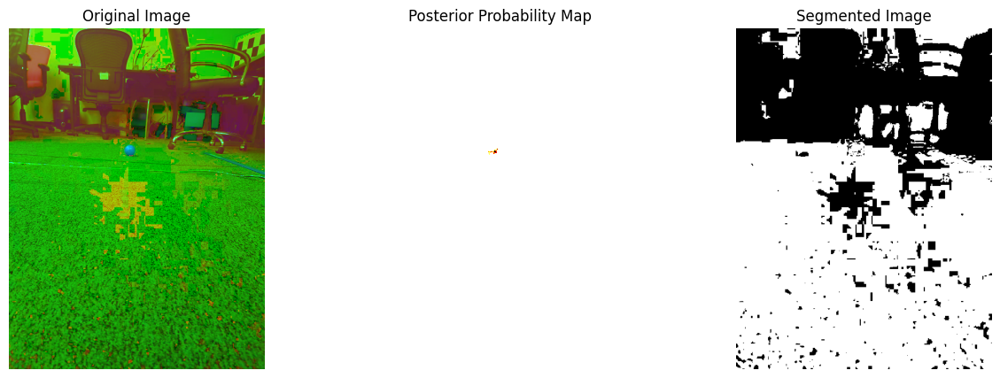

C:\Users\aryan\AppData\Local\Temp\ipykernel_17980\1263745504.py:65: RuntimeWarning:

invalid value encountered in divide



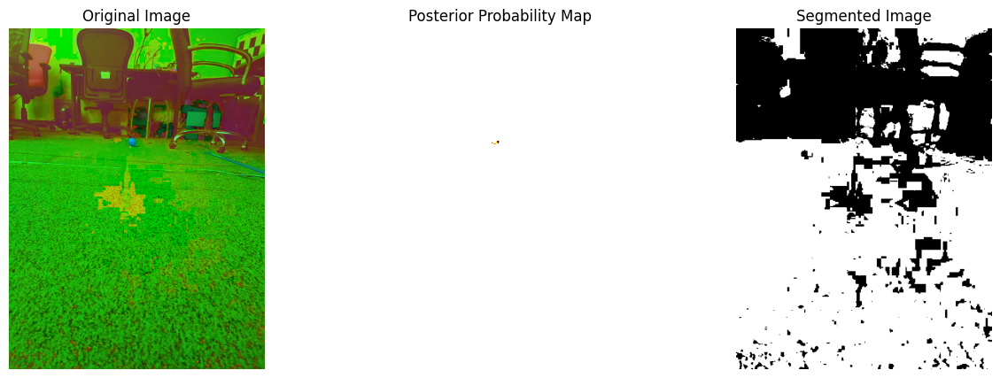

C:\Users\aryan\AppData\Local\Temp\ipykernel_17980\1263745504.py:65: RuntimeWarning:

invalid value encountered in divide



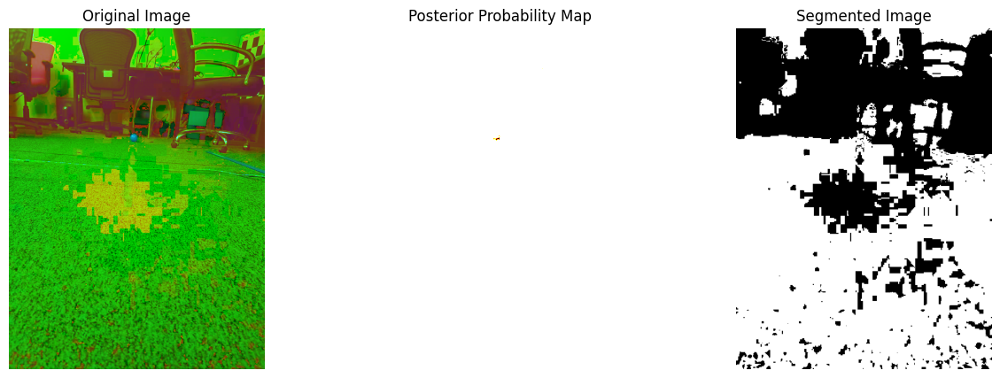

Segmentation complete. Results saved in the result folder.
[(322.0274963378906, 378.0501708984375, 180.07093811035156), (346.0, 373.5, 160.132080078125), (324.0, 395.5, 142.20858764648438), (239.5, 436.5, 313.6344299316406), (239.5, 429.5, 318.19891357421875), (239.5, 426.5, 320.18206787109375), (239.5, 425.5, 320.84661865234375), (239.5, 422.5, 322.8506774902344)]
Radii: [180.07093811 160.13208008 142.20858765 313.63442993 318.19891357
 320.18206787 320.84661865 322.85067749]
Fitted parameters: a = 2841.2658371558773 b = 6.855367993878903
Estimated relative distances: [1.04592963 1.03442056 1.         1.08056082 1.16193298 8.
 6.59968712 5.36946105]


In [23]:
cluster_parameters = testGMM(Model_parameters,0.9, 0)
print(cluster_parameters)
distance = measureDepth(cluster_parameters)

In [8]:
def plotGMM_HSL(model_parameters, flattened):
    print("Plotting the GMM model")
    scalars, means, covariances = model_parameters
    K = len(scalars)  # number of Gaussian components

    # Plot the GMM model
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Plot the data points
    ax.scatter(flattened[:, 0], flattened[:, 1], flattened[:, 2], c='b', marker='o', label='Data points')

    # Plot the Gaussian components
    for i in range(K):
        mean = means[i]
        covariance = covariances[i]
        x, y, z = np.random.multivariate_normal(mean, covariance, 5000).T
        ax.scatter(x, y, z, marker='.', label=f'Gaussian {i + 1}')

    ax.set_xlabel('Hue')
    ax.set_ylabel('Lightness')
    ax.set_zlabel('Saturation')
    ax.set_title('Gaussian Mixture Model')

    plt.legend()
    plt.show()

Plotting the GMM model


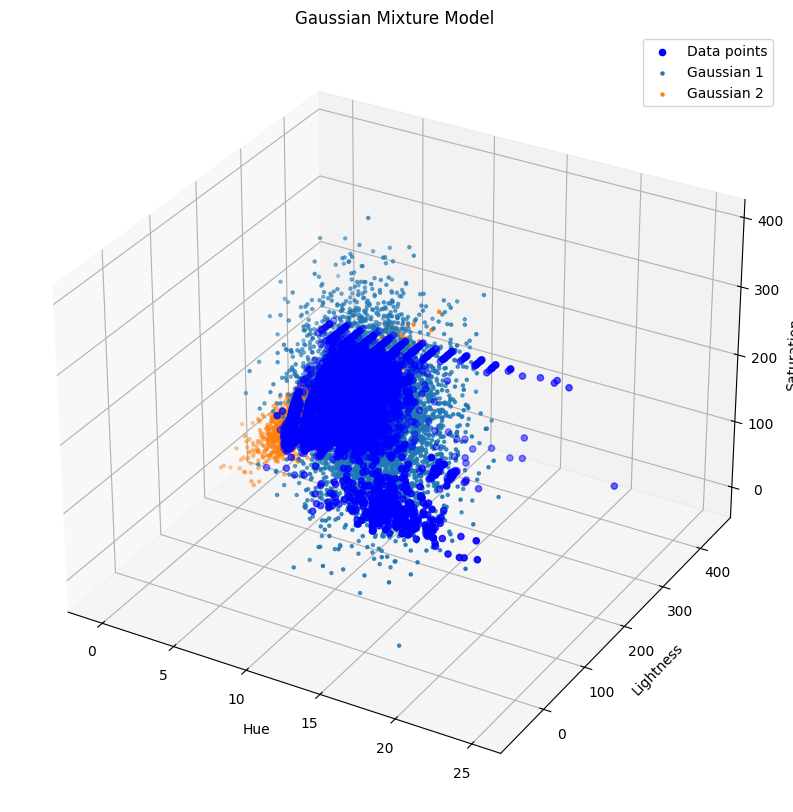

In [9]:
plotGMM_HSL(Model_parameters, flattened)

In [15]:
import plotly.express as px
import numpy as np

def plotGMM_HSL_moveable(Model_parameters, flattened):
    # Use plotly to plot the GMM model

    scalars, means, covariances = Model_parameters

    K = len(scalars)  # number of Gaussian components

    # Plot the GMM model
    fig = px.scatter_3d(x=flattened[:, 0], y=flattened[:, 1], z=flattened[:, 2], color=flattened[:, 0],
                        title='Gaussian Mixture Model')
    
    # Remove legend for color
    fig.update_traces(marker=dict(size=1), selector=dict(mode='markers'))
    fig.update_layout(showlegend=False)

    for i in range(K):
        mean = means[i]
        covariance = covariances[i]
        x, y, z = np.random.multivariate_normal(mean, covariance, 5000).T
        #fig.add_scatter3d(x=x, y=y, z=z, mode='markers', marker=dict(size=1), name=f'Gaussian {i + 1}')

    fig.update_layout(scene=dict(xaxis_title='Hue', yaxis_title='Lightness', zaxis_title='Saturation'))

    fig.show()

In [16]:
plotGMM_HSL_moveable(Model_parameters, flattened)

In [ ]:
print(distance)

# Video Lecture
Click [here](https://www.youtube.com/watch?v=D5AcaFMY_BI) for a video lecture to help you better understand the project.

## Report
For each section of the project, explain briefly what you did, and describe any interesting problems you encountered and/or solutions you implemented. You must include the following details in your writeup:

- Your choice of color space, initialization method and number of gaussians in the GMM
- Explain why GMM is better than single gaussian
- Present your distance estimate and cluster segmentation results for each test image
- Explain strengths and limitations of your algorithm. Also, explain why the algorithm failed on some test images

As usual, your report must be full English sentences, not commented code. There is a word limit of 1500 words and no minimum length requirement.

## ***add your report here***


# Submission Guidelines

**If your submission does not comply with the following guidelines, you’ll be given ZERO credit.**

Your submission on ELMS(Canvas) must be a pdf file, following the naming convention **YourDirectoryID_proj1.pdf**. For example, xyz123_proj1.pdf.

**All your results and report should be included in this notebook. After you finished all, please export the notebook as a pdf file and submit it to ELMS(Canvas).**

# Collaboration Policy
You are encouraged to discuss the ideas with your peers. However, the code should be your own, and should be the result of you exercising your own understanding of it. If you reference anyone else’s code in writing your project, you must properly cite it in your code (in comments) and your writeup. For the full honor code refer to the CMSC426 Fall 2023 website.